In [1]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import pandas as pd
import numpy as np
import seaborn as sns
import joblib
import matplotlib as plt

from sklearn.metrics import classification_report, plot_confusion_matrix, plot_roc_curve, accuracy_score, confusion_matrix

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-dg7ykysx because the default path (/home/abyss/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
import sys

gdrive_project_root = '../' 
is_cloud = False

if 'google.colab' in sys.modules:
    is_cloud = True
    from google.colab import drive
    # define project root / change to match your path
    path_mv = "drive/MyDrive/01-Education/03-PhD/2021/Courses/HCI/hci_code/"
    path_mg = "drive/MyDrive/HCI/hci_code/"
    path_nj = ""

    # change to your private path
    gdrive_project_root = path_mv
    drive.mount('/content/drive', force_remount=True)  

In [3]:
X = pd.read_csv(gdrive_project_root  + 'data/processed/2nd_dataset/3_cls_model_input/X_3cls.csv')
y = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/y_3cls.csv')
X_train = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/X_train_3cls.csv')
X_test = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/X_test_3cls.csv')
y_train = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/y_train_3cls.csv')
y_test = pd.read_csv(gdrive_project_root + 'data/processed/2nd_dataset/3_cls_model_input/y_test_3cls.csv')

In [4]:
clf = joblib.load(gdrive_project_root + 'models/CLF_3classes_GBM-AASTR-ODG_RandomForest_100estimators_42_random_state.pkl')

/home/abyss/anaconda3/envs/hci2/lib/python3.9/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator DecisionTreeClassifier from version 0.22.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
/home/abyss/anaconda3/envs/hci2/lib/python3.9/site-packages/sklearn/base.py:310: UserWarning: Trying to unpickle estimator RandomForestClassifier from version 0.22.1 when using version 0.24.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(


In [5]:
predictions = clf.predict(X_test)
print("Model accuracy: %s \n" % accuracy_score(y_test, predictions))
print(classification_report(y_test, predictions))

Model accuracy: 0.76953125 

              precision    recall  f1-score   support

           1       0.83      0.94      0.88       177
           2       0.48      0.29      0.36        45
           3       0.64      0.53      0.58        34

    accuracy                           0.77       256
   macro avg       0.65      0.59      0.61       256
weighted avg       0.74      0.77      0.75       256



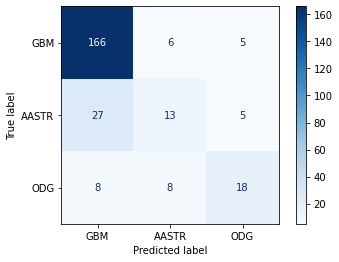

In [6]:
plot_confusion_matrix(clf, X_test, y_test, cmap = plt.cm.Blues, display_labels=["GBM", "AASTR", "ODG"], values_format = '')

# Matej

## Dalex


In [7]:
if is_cloud:
    !{sys.executable} -m pip install dalex --user


In [8]:
%load_ext autoreload
%autoreload 2

In [9]:
import dalex as dx

In [10]:
%%time
exp = dx.Explainer(clf, X, y)


Preparation of a new explainer is initiated

  -> data              : 1276 rows 252 cols
  -> target variable   : Parameter 'y' was a pandas.DataFrame. Converted to a numpy.ndarray.
  -> target variable   : 1276 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f4d94b799d0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.187, max = 0.98
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = 0.43, mean = 1.26, max = 3.0
  -> model_info        : package sklearn

A new explainer has been created!
CPU times: user 76.9 ms, sys: 330 µs, total: 77.2 ms
Wall time: 72.2 ms


In [11]:
%%time
vi = exp.model_parts()

CPU times: user 1min 20s, sys: 21.3 ms, total: 1min 20s
Wall time: 1min 20s


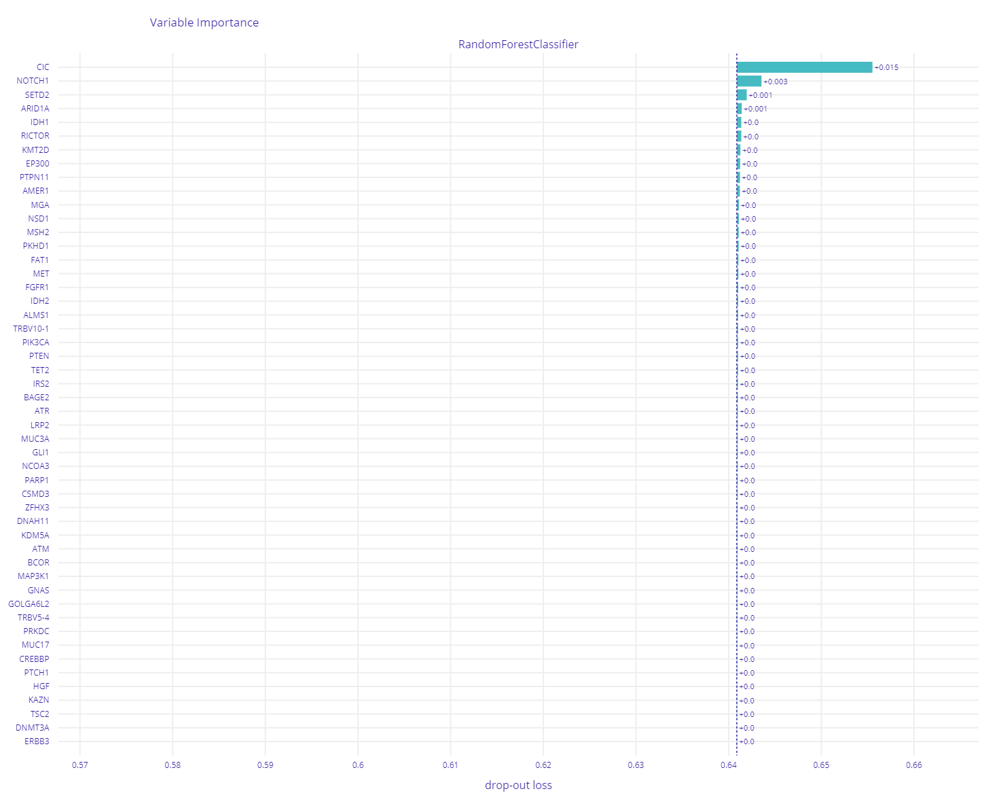

CPU times: user 198 ms, sys: 30.1 ms, total: 228 ms
Wall time: 241 ms


In [12]:
%%time
vi.plot(max_vars=50)


### ELI5


In [13]:
if is_cloud:
    !{sys.executable} install eli5


In [14]:
import eli5

In [15]:
%%time
eli5.show_weights(clf,
                  feature_names=X_train.columns.to_list(),
                  target_names=y.columns.to_list(), top=252)


# ‘targets’ - per-target feature weights;
# ‘transition_features’ - transition features of a CRF model;
# ‘feature_importances’ - feature importances of a decision tree or an ensemble-based estimator;
# ‘decision_tree’ - decision tree in a graphical form;
# ‘method’ - a string with explanation method;
# ‘description’ - description of explanation method and its caveats.

CPU times: user 80.8 ms, sys: 3 µs, total: 80.8 ms
Wall time: 79.8 ms


Weight,Feature
0.3212 ± 0.0971,Overall Survival (Months)
0.2857 ± 0.0972,Diagnosis Age
0.1681 ± 0.0527,Mutation Count
0.0375 ± 0.0254,Overall Survival Status
0.0250 ± 0.0249,Sex
0.0249 ± 0.0231,CIC
0.0201 ± 0.0145,TP53
0.0149 ± 0.0157,Somatic Status
0.0091 ± 0.0109,ATRX
0.0081 ± 0.0091,EGFR


### InterpretML
---
Glassbox model

In [16]:
if is_cloud:
    !{sys.executable} -m pip install interpret


In [17]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split

from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show




In [19]:
%%time
ebm = ExplainableBoostingClassifier(random_state=42)
ebm.fit(X_train, y_train)

ebm_global = ebm.explain_global()


/home/abyss/anaconda3/envs/hci2/lib/python3.9/site-packages/interpret/glassbox/ebm/ebm.py:922: UserWarning:

Multiclass is still experimental. Subject to change per release.

/home/abyss/anaconda3/envs/hci2/lib/python3.9/site-packages/interpret/glassbox/ebm/ebm.py:925: UserWarning:

Detected multiclass problem: forcing interactions to 0



CPU times: user 4.25 s, sys: 211 ms, total: 4.46 s
Wall time: 16.1 s


In [20]:
%%time
show(ebm_global)

CPU times: user 7.64 s, sys: 80.1 ms, total: 7.72 s
Wall time: 7.72 s


### SHAP


In [21]:
if is_cloud:
    !{sys.executable} install shap


In [22]:
import shap


In [23]:
%%time
# summarize the effects of all the features
# Create object that can calculate shap values

explainer = shap.TreeExplainer(clf)

# Calculate Shap values
shap_values = explainer.shap_values(X_test)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


CPU times: user 13.9 s, sys: 19.7 ms, total: 13.9 s
Wall time: 13.8 s


In [24]:
%%time

shap.initjs()


CPU times: user 9.82 ms, sys: 0 ns, total: 9.82 ms
Wall time: 8.86 ms


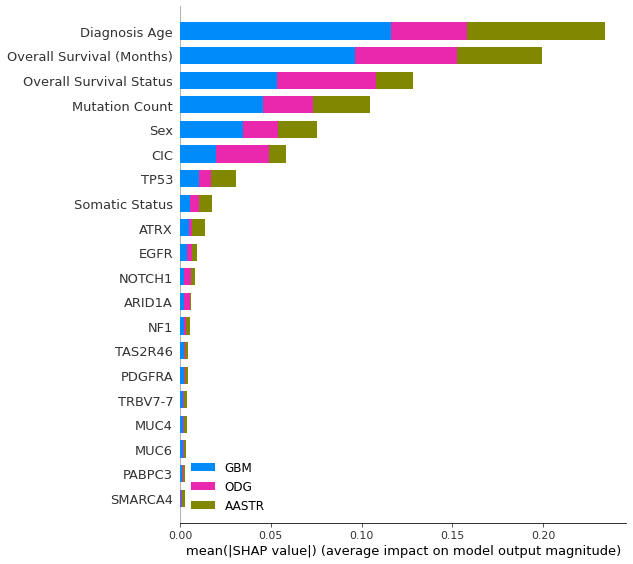

CPU times: user 323 ms, sys: 12 µs, total: 323 ms
Wall time: 320 ms


In [26]:
%%time
shap.summary_plot(shap_values, features=X, feature_names=X.columns, class_names=["GBM", "AASTR", "ODG"])


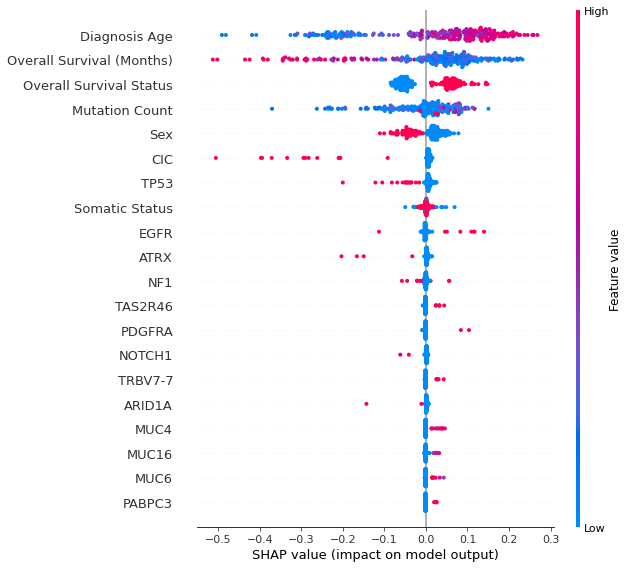

CPU times: user 642 ms, sys: 20.1 ms, total: 662 ms
Wall time: 656 ms


In [27]:
%%time

shap.initjs()
# GBM class
# shap.summary_plot(explainer.expected_value[1], shap_values[1], X)
shap_values1 = explainer.shap_values(X_test, approximate=True)
shap.summary_plot(shap_values1[0], X_test, class_names=["GBM", "AASTR", "ODG"])